## 1. Business Understanding

- A manager at the bank is disturbed with more and more customers leaving their credit card services. They would really appreciate if one could predict for them who is gonna get churned so they can proactively go to the customer to provide them better services and turn customers' decisions in the opposite direction
- Now, this dataset consists of 10,000 customers mentioning their age, salary, marital_status, credit card limit, credit card category, etc. There are nearly 18 features.
- This dataset is taken from [https://www.kaggle.com/sakshigoyal7/credit-card-customers](https://www.kaggle.com/sakshigoyal7/credit-card-customers)

## 2. Data Understanding/ Acquire

- This dataset consists of 10,000 customers
- Dataset features:
    - CLIENTNUM: Client number. Unique identifier for the customer holding the account
    - Attrition_Flag: Internal event (customer activity) variable - if the account is closed then 1 else 0
    - Customer_Age: Customer's Age in Years
    - Gender: M=Male, F=Female
    - Dependent_count: Number of dependents
    - Education_Level: Educational Qualification of the account holder (example: high school, college graduate, etc.)
    - Marital_Status: Married, Single, Divorced, Unknown
    - Income_Category: Annual Income Category of the account holder (<40K, 40K - 60K, 60K - 80K, 80K-120K, > 120K, Unknown)
    - Card_Category: Type of Card (Blue, Silver, Gold, Platinum)
    - Months_on_book: Period of relationship with bank
    - Total_Relationship_Count: Total no. of products held by the customer
    - Months_Inactive_12_mon: No. of months inactive in the last 12 months
    - Contacts_Count_12_mon: No. of Contacts in the last 12 months
    - Credit_Limit: Credit Limit on the Credit Card
    - Total_Revolving_Bal: Total Revolving Balance on the Credit Card
    - Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
    - Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
    - Total_Trans_Amt: Total Transaction Amount (Last 12 months)
    - Total_Trans_Ct: Total Transaction Count (Last 12 months)
    - Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
    - Avg_Utilization_Ratio: Average Card Utilization Ratio

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
sns.set()

In [2]:
df = pd.read_csv('BankChurners.csv', )

In [3]:
df.shape

(10127, 23)

In [4]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [5]:
df = df.iloc[:, :21]

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [7]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### 2.1 Define type of variable
    1. Input: <> Attrition_Flag
    2. Output: Attrition_Flag
    3. Type of variable: 
        3.1 Predictor: <> Attrition_Flag
        3.2 Target: Attrition_Flag
    4. Data type:
        4.1 Charactor/ String
        4.2 Numeric
    5. Variable Category

In [8]:
numbers = df.select_dtypes(exclude='object').columns.tolist()

In [9]:
numbers

['CLIENTNUM',
 'Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [10]:
objects = df.select_dtypes('object').columns.tolist()

In [11]:
objects

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

    5. Variable
        5.1 Categorical:
        5.2 Continuous

In [12]:
# Categorical:
i = 1
for obj in objects:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', df[obj].unique())
    i = i+1

1 / Attrition_Flag 	 2 : ['Existing Customer' 'Attrited Customer']
2 / Gender 	 2 : ['M' 'F']
3 / Education_Level 	 7 : ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
4 / Marital_Status 	 4 : ['Married' 'Single' 'Unknown' 'Divorced']
5 / Income_Category 	 6 : ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
6 / Card_Category 	 4 : ['Blue' 'Gold' 'Silver' 'Platinum']


In [13]:
# Gender
df['Gender'].value_counts()

F    5358
M    4769
Name: Gender, dtype: int64

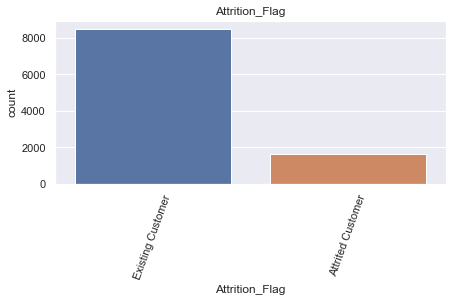

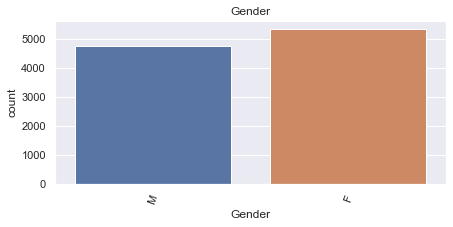

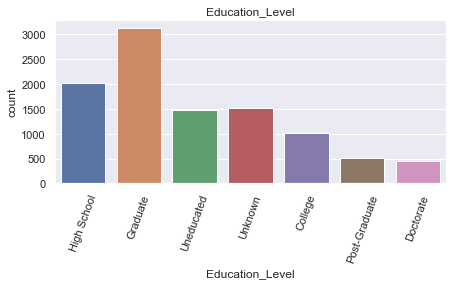

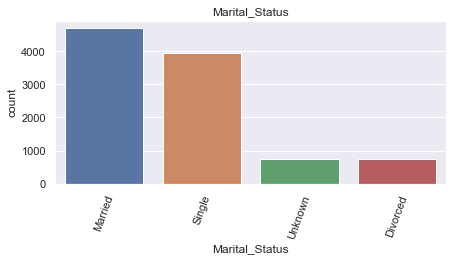

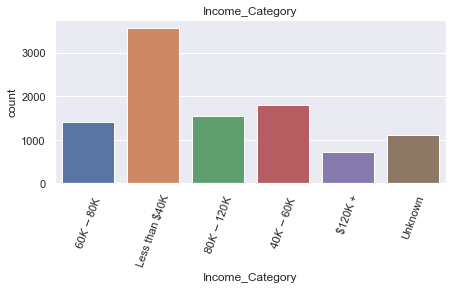

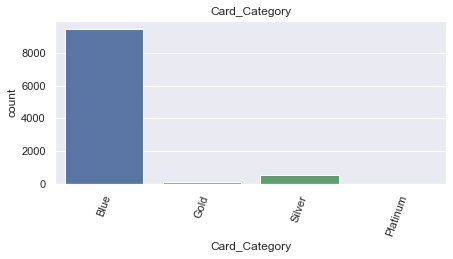

In [14]:
for obj in objects:
    plt.figure(figsize=(7,3))
    sns.countplot(df[obj])
    plt.title(obj)
    plt.xticks(rotation=70);

- High imbalabce between attrited and existing customer
- There is no significant imbalance between M and F in our customer
- For marital_status, we can combine unknown and divorce in 1 categorical
- almost our customer hold blue card
- Majority of customers has income less than $40k

In [15]:
objects

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [16]:
obj_inputs = objects.copy()

In [17]:
obj_inputs.remove('Attrition_Flag')

In [18]:
obj_inputs

['Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

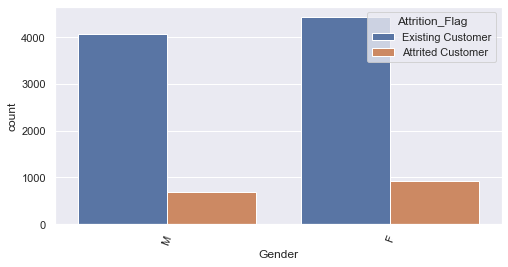

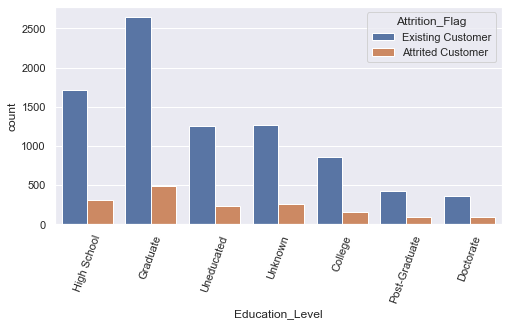

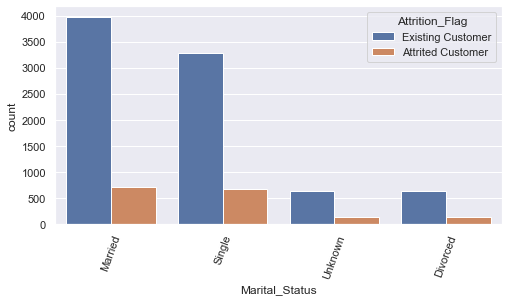

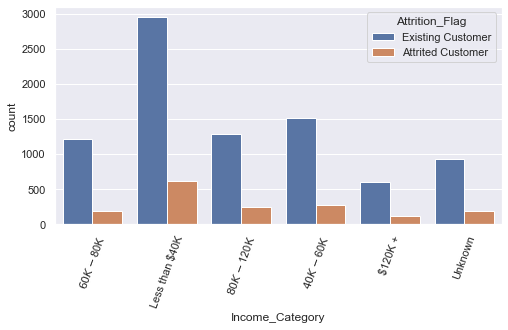

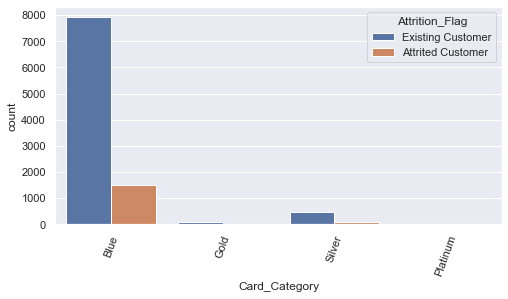

In [19]:
for obj in obj_inputs:
    plt.figure(figsize=(8,4))
    sns.countplot(data=df[objects], x=obj, hue='Attrition_Flag')
    plt.xticks(rotation = 70)

In [20]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

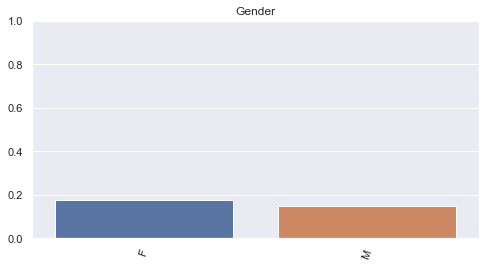

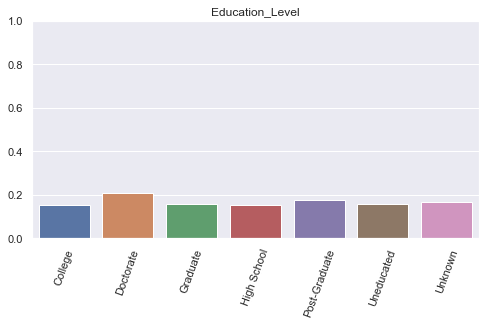

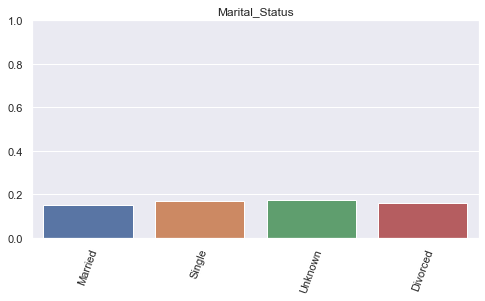

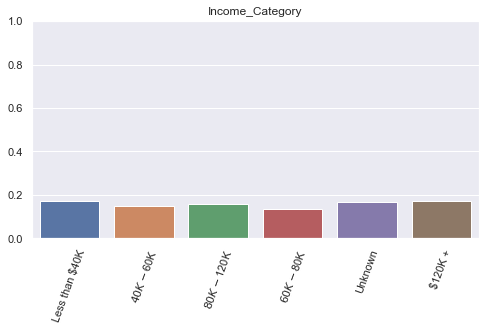

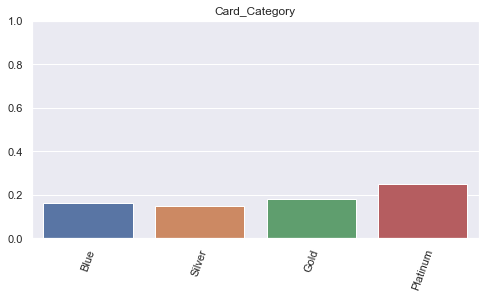

In [21]:
for obj in obj_inputs:
    result = df[df['Attrition_Flag'] == 'Attrited Customer'][obj].value_counts()/ df[obj].value_counts()
    plt.figure(figsize=(8,4))
    sns.barplot(x=result.index, y = result.values)
    plt.title(obj)
    plt.xticks(rotation = 70)
    plt.ylim(0,1)

In [22]:
# Categorical & Continuous:
for obj in numbers:
    print(i, '/', obj, '\t', len(df[obj].unique()), ':', 
          df[obj].unique() if len(df[obj].unique()) < 150 else 'Continuous' )
    i = i+1

7 / CLIENTNUM 	 10127 : Continuous
8 / Customer_Age 	 45 : [45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]
9 / Dependent_count 	 6 : [3 5 4 2 0 1]
10 / Months_on_book 	 44 : [39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]
11 / Total_Relationship_Count 	 6 : [5 6 4 3 2 1]
12 / Months_Inactive_12_mon 	 7 : [1 4 2 3 6 0 5]
13 / Contacts_Count_12_mon 	 7 : [3 2 0 1 4 5 6]
14 / Credit_Limit 	 6205 : Continuous
15 / Total_Revolving_Bal 	 1974 : Continuous
16 / Avg_Open_To_Buy 	 6813 : Continuous
17 / Total_Amt_Chng_Q4_Q1 	 1158 : Continuous
18 / Total_Trans_Amt 	 5033 : Continuous
19 / Total_Trans_Ct 	 126 : [ 42  33  20  28  24  31  36  32  26  17  29  27  21  30  16  18  23  22
  40  38  25  43  37  19  35  15  41  57  12  14  34  44  13  47  10  39
  53  50  52  48  49  45  11  55  46  54  60  51  63  58  59  61  7

In [23]:
import pandas_profiling as pp

In [24]:
profile = pp.ProfileReport(df[numbers])
profile

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
df[numbers].head()

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,45,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,49,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,51,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,40,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,40,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [26]:
numbers.remove('CLIENTNUM')

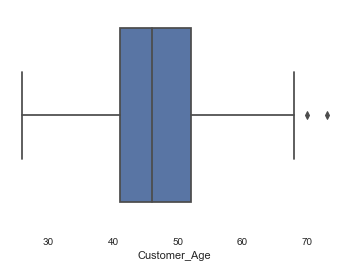

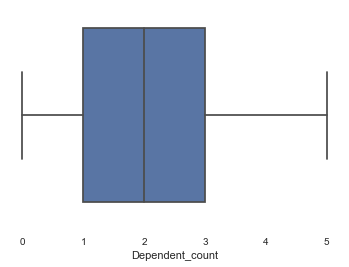

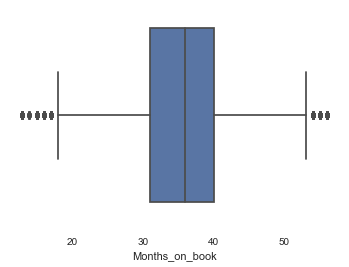

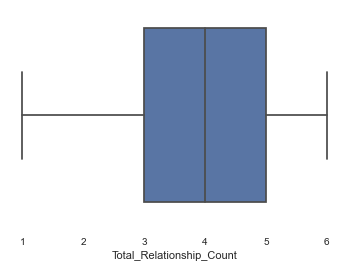

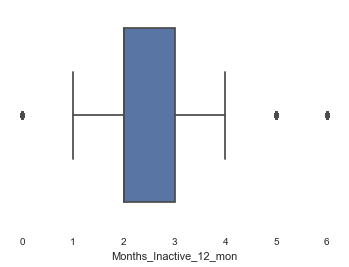

...

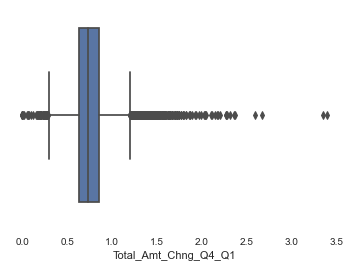

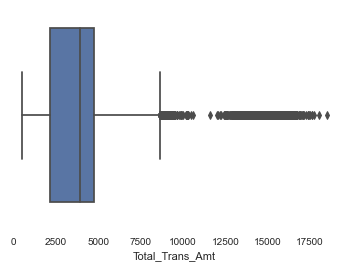

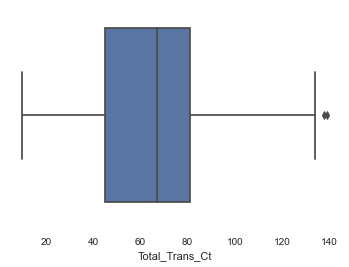

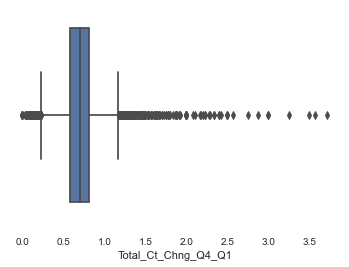

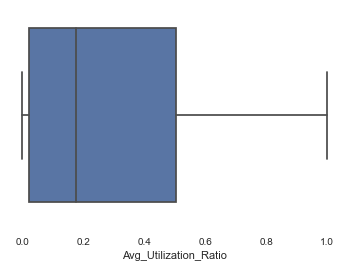

In [27]:
for obj in numbers:
    plt.figure(figsize=(6,4))
    sns.boxplot(df[obj])

<AxesSubplot:>

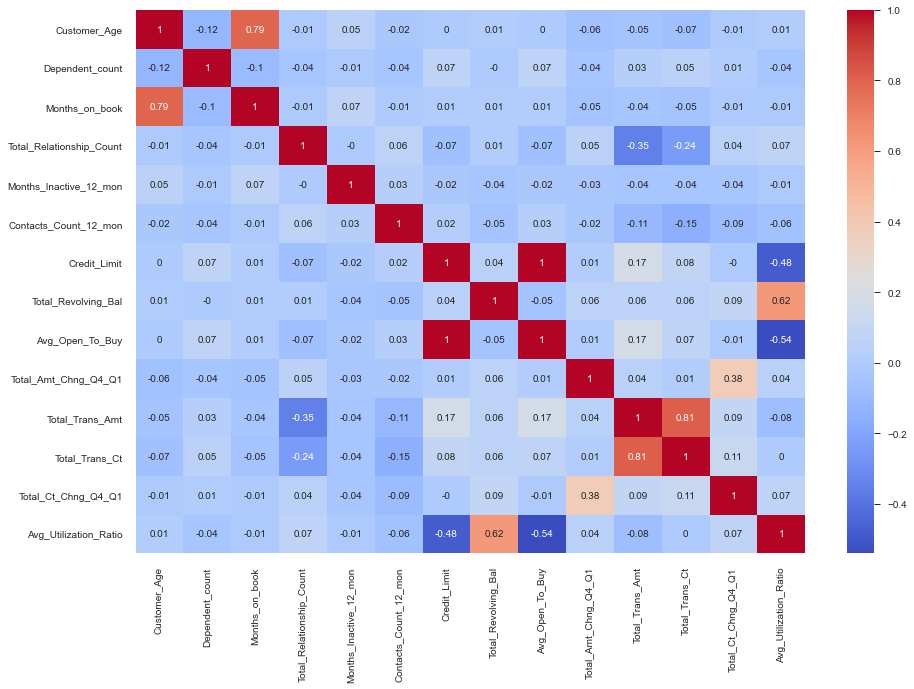

In [28]:
plt.figure(figsize=(15,10))
sns.heatmap(df[numbers].corr().round(2), cmap='coolwarm', annot=True)

## 3. Data preparation

In [29]:
# Transform categorical data into number form

In [30]:
objects

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [31]:
# transform gender 
df_new = pd.get_dummies(data=df, columns=['Gender'], drop_first=True)

In [32]:
df_new.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M
0,768805383,Existing Customer,45,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,818770008,Existing Customer,49,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,Existing Customer,51,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,769911858,Existing Customer,40,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,Existing Customer,40,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [33]:
# Label Encoder for Card_category
df_new['Card_Category'].replace(df_new['Card_Category'].unique().tolist(), [1,2,3,4], inplace=True)

In [34]:
df_new.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M
0,768805383,Existing Customer,45,3,High School,Married,$60K - $80K,1,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1
1,818770008,Existing Customer,49,5,Graduate,Single,Less than $40K,1,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,Existing Customer,51,3,Graduate,Married,$80K - $120K,1,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,769911858,Existing Customer,40,4,High School,Unknown,Less than $40K,1,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,Existing Customer,40,3,Uneducated,Married,$60K - $80K,1,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


In [35]:
df['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [36]:
df_new['Card_Category'].value_counts()

1    9436
3     555
2     116
4      20
Name: Card_Category, dtype: int64

In [37]:
df_new['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'Unknown', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [38]:
# Label Encoder for Education level
df_new['Education_Level'].replace(df_new['Education_Level'].unique().tolist(), [2,4,1,0,3,5,6], inplace=True)

In [39]:
df_new['Education_Level'].value_counts()

4    3128
2    2013
0    1519
1    1487
3    1013
5     516
6     451
Name: Education_Level, dtype: int64

In [40]:
df['Education_Level'].value_counts()

Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [41]:
df_new['Income_Category'].unique().tolist()

['$60K - $80K',
 'Less than $40K',
 '$80K - $120K',
 '$40K - $60K',
 '$120K +',
 'Unknown']

In [42]:
df_new['Income_Category'].replace(df_new['Income_Category'].unique().tolist(), [3,1,4,2,5,0], inplace=True)

In [43]:
df_new['Income_Category'].value_counts()

1    3561
2    1790
4    1535
3    1402
0    1112
5     727
Name: Income_Category, dtype: int64

In [44]:
df['Income_Category'].value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

In [45]:
df_new = pd.get_dummies(data=df_new, columns=['Attrition_Flag'])

In [46]:
df_new.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Attrition_Flag_Attrited Customer,Attrition_Flag_Existing Customer
0,768805383,45,3,2,Married,3,1,39,5,1,...,777,11914.0,1.335,1144,42,1.625,0.061,1,0,1
1,818770008,49,5,4,Single,1,1,44,6,1,...,864,7392.0,1.541,1291,33,3.714,0.105,0,0,1
2,713982108,51,3,4,Married,4,1,36,4,1,...,0,3418.0,2.594,1887,20,2.333,0.000,1,0,1
3,769911858,40,4,2,Unknown,1,1,34,3,4,...,2517,796.0,1.405,1171,20,2.333,0.760,0,0,1
4,709106358,40,3,1,Married,3,1,21,5,1,...,0,4716.0,2.175,816,28,2.500,0.000,1,0,1


In [47]:
df_new.rename(columns={'Attrition_Flag_Attrited Customer': 'Churn'}, inplace=True)

In [48]:
df_new.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn,Attrition_Flag_Existing Customer
0,768805383,45,3,2,Married,3,1,39,5,1,...,777,11914.0,1.335,1144,42,1.625,0.061,1,0,1
1,818770008,49,5,4,Single,1,1,44,6,1,...,864,7392.0,1.541,1291,33,3.714,0.105,0,0,1
2,713982108,51,3,4,Married,4,1,36,4,1,...,0,3418.0,2.594,1887,20,2.333,0.000,1,0,1
3,769911858,40,4,2,Unknown,1,1,34,3,4,...,2517,796.0,1.405,1171,20,2.333,0.760,0,0,1
4,709106358,40,3,1,Married,3,1,21,5,1,...,0,4716.0,2.175,816,28,2.500,0.000,1,0,1


In [49]:
df_new.drop('Attrition_Flag_Existing Customer', axis=1, inplace=True)

In [50]:
df_new.head()

,CLIENTNUM,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn
0,768805383,45,3,2,Married,3,1,39,5,1,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,0
1,818770008,49,5,4,Single,1,1,44,6,1,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,0
2,713982108,51,3,4,Married,4,1,36,4,1,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1,0
3,769911858,40,4,2,Unknown,1,1,34,3,4,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,0
4,709106358,40,3,1,Married,3,1,21,5,1,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1,0


In [51]:
# Drop column CLIENTNUM cause this feature does not contribute for our model
df_new.drop('CLIENTNUM', axis=1, inplace=True)

In [52]:
df_new.head()

,Customer_Age,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn
0,45,3,2,Married,3,1,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,0
1,49,5,4,Single,1,1,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,0
2,51,3,4,Married,4,1,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1,0
3,40,4,2,Unknown,1,1,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,0
4,40,3,1,Married,3,1,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1,0


<AxesSubplot:>

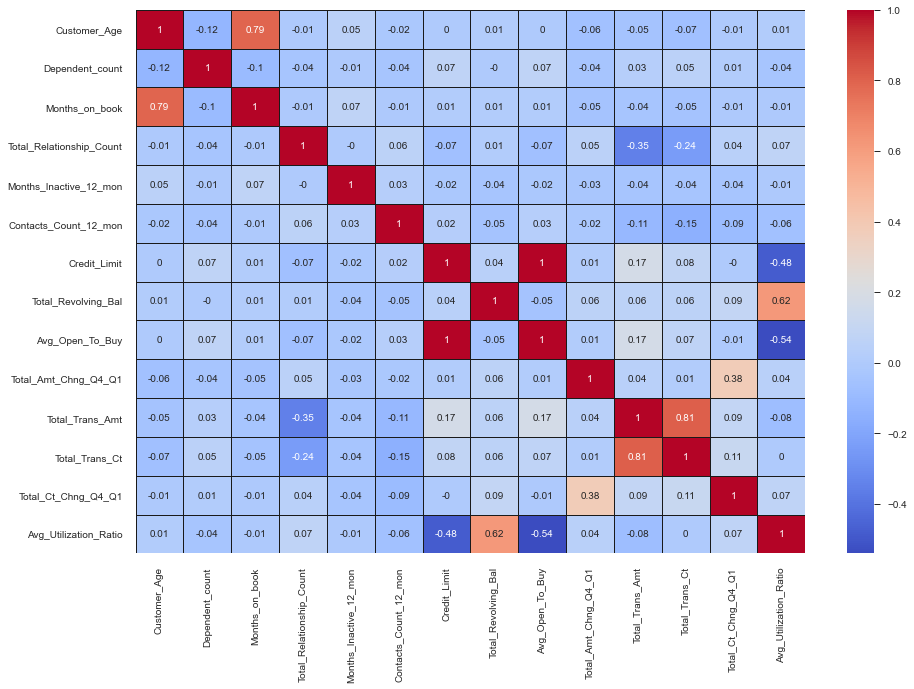

In [53]:
plt.figure(figsize=(15,10))
sns.heatmap(df[numbers].corr().round(2), cmap='coolwarm', annot=True, linecolor='k', linewidths=0.5)

- The Credit_limit and Avg_open_to_buy have perfectly correlation => we keep only 1 feature: Credit_Limit
- 'Months_on_book' and 'Customer_Age' have very strong correlation => we consider to keep only 1 feature
- 'Total_Trans_Amt' and 'Total_Trans_Ct' have very strong correlation => we consider to keep only 1 feature

In [54]:
df_new.drop('Avg_Open_To_Buy', axis=1, inplace=True)

<AxesSubplot:xlabel='Months_on_book', ylabel='Customer_Age'>

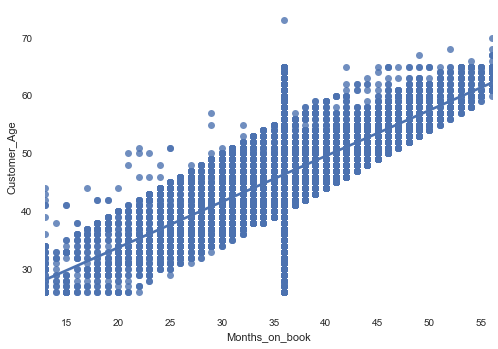

In [55]:
sns.regplot(data=df_new, x='Months_on_book', y='Customer_Age')

<AxesSubplot:xlabel='Months_on_book', ylabel='Customer_Age'>

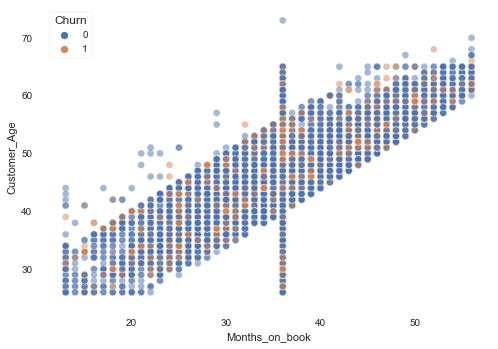

In [56]:
sns.scatterplot(data=df_new, x='Months_on_book', y='Customer_Age', hue='Churn', alpha=0.5)

<AxesSubplot:xlabel='Marital_Status', ylabel='Customer_Age'>

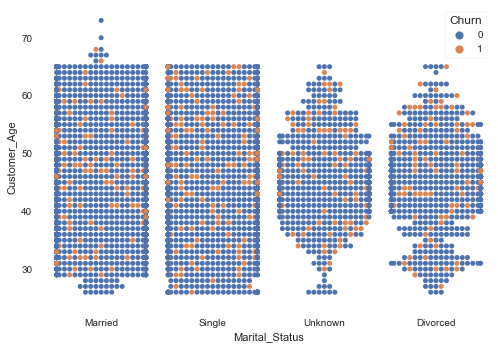

In [57]:
sns.swarmplot(data=df_new, x = 'Marital_Status', y = 'Customer_Age', hue='Churn' )

<AxesSubplot:xlabel='Months_on_book', ylabel='Customer_Age'>

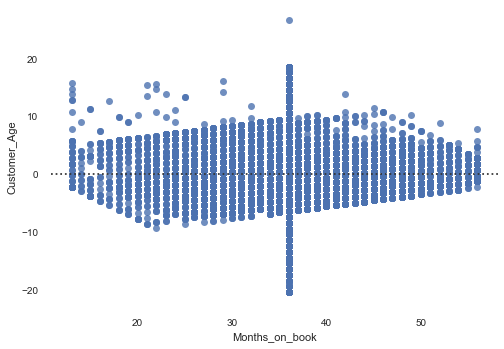

In [58]:
sns.residplot(df_new['Months_on_book'], df_new['Customer_Age'])

<AxesSubplot:xlabel='Total_Trans_Ct', ylabel='Total_Trans_Amt'>

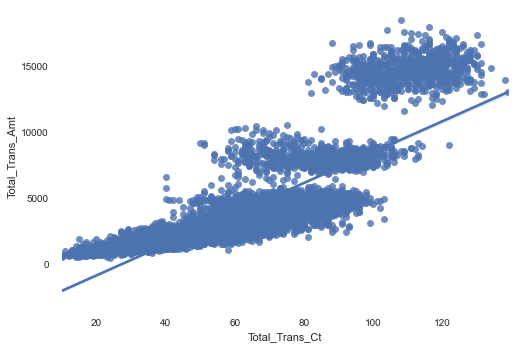

In [59]:
sns.regplot(data=df_new, y='Total_Trans_Amt', x='Total_Trans_Ct')

<AxesSubplot:xlabel='Total_Trans_Ct', ylabel='Total_Trans_Amt'>

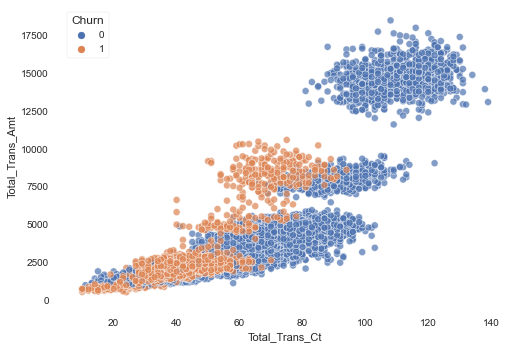

In [61]:
sns.scatterplot(data=df_new, y='Total_Trans_Amt', x='Total_Trans_Ct', hue='Churn', alpha=0.7)

<AxesSubplot:xlabel='Total_Trans_Amt', ylabel='Total_Trans_Ct'>

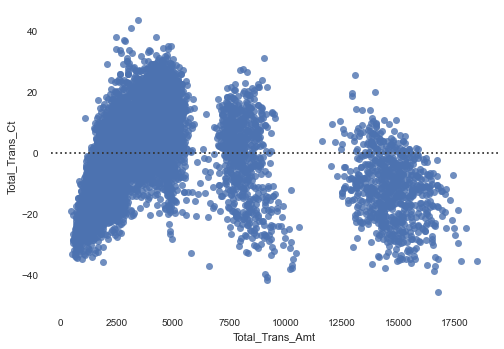

In [60]:
sns.residplot(data=df_new, x='Total_Trans_Amt', y='Total_Trans_Ct')

<AxesSubplot:>

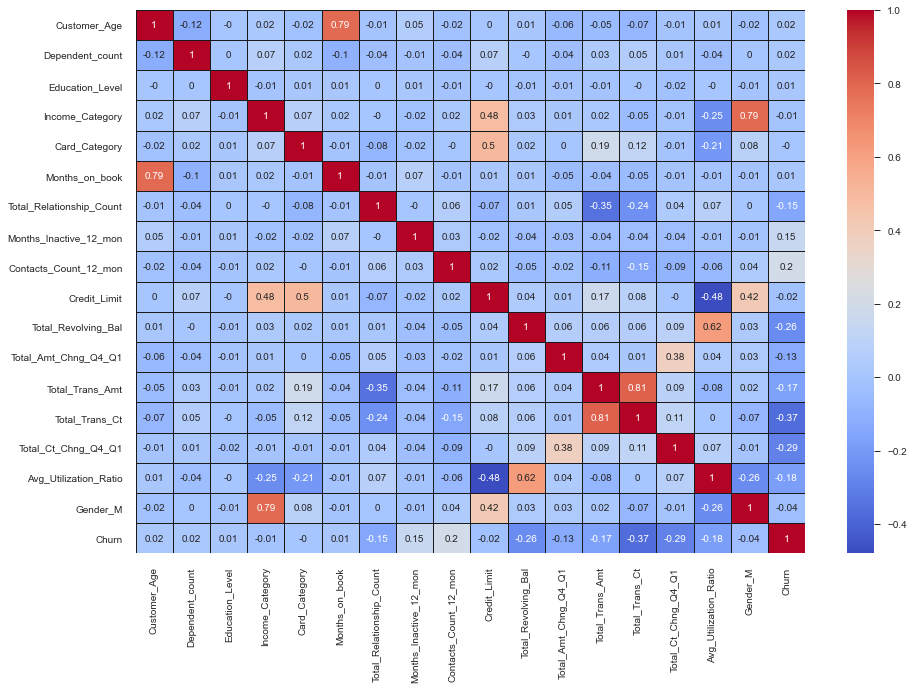

In [61]:
plt.figure(figsize=(15,10))
sns.heatmap(df_new.corr().round(2), cmap='coolwarm', annot=True, linecolor='k', linewidths=0.5)

In [62]:
df_new.columns

Index(['Customer_Age', 'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Gender_M', 'Churn'],
      dtype='object')

In [63]:
new_objects = ['Customer_Age', 'Dependent_count', 'Education_Level', 'Marital_Status',
               'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
               'Contacts_Count_12_mon', 'Income_Category', 'Card_Category', 'Gender_M']

In [64]:
from scipy.stats import chi2, chi2_contingency
prob = {}
for obj in new_objects:
    table = pd.crosstab(df_new[obj], df_new['Churn'])
    stat, p, dof, expected = chi2_contingency(table)
    prob[obj] = p

In [65]:
prob

{'Customer_Age': 0.02082917739428747,
 'Dependent_count': 0.09150463456682643,
 'Education_Level': 0.05148913147336627,
 'Marital_Status': 0.10891263394840227,
 'Months_on_book': 0.05742908739736116,
 'Total_Relationship_Count': 2.6610499913717976e-59,
 'Months_Inactive_12_mon': 1.6155198022594863e-82,
 'Contacts_Count_12_mon': 1.7769862229781973e-123,
 'Income_Category': 0.025002425704390614,
 'Card_Category': 0.5252382797994759,
 'Gender_M': 0.00019635846717310307}

- There is the dependence between 'Customer_Age', 'Income_Category' and 'Gender_M' to 'Churn'

In [66]:
dependence = []
independence = []
for key, value in prob.items():
    if value <= 0.05:
        dependence.append(key)
    else: independence.append(key)

In [67]:
(dependence, independence)

(['Customer_Age',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon',
  'Income_Category',
  'Gender_M'],
 ['Dependent_count',
  'Education_Level',
  'Marital_Status',
  'Months_on_book',
  'Card_Category'])

In [68]:
df_new.drop(columns=independence, inplace=True)

In [69]:
df_new.head()

,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Churn
0,45,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,1,0
1,49,1,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0,0
2,51,4,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000,1,0
3,40,1,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760,0,0
4,40,3,5,1,0,4716.0,0,2.175,816,28,2.500,0.000,1,0


In [70]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [71]:
model = ols('Credit_Limit ~ C(Churn)', data=df_new ).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(Churn),4.767191e+08,1.0,5.773729,0.016285
Residual,8.359902e+11,10125.0,NaN,NaN


In [72]:
anova_table['PR(>F)'][0]

0.016285357205197453

In [73]:
continuous = [i for i in (set(df_new.columns) - set(new_objects))]

In [74]:
continuous.remove('Churn')

In [75]:
continuous

['Total_Amt_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Credit_Limit',
 'Total_Ct_Chng_Q4_Q1',
 'Total_Revolving_Bal',
 'Total_Trans_Amt',
 'Total_Trans_Ct']

In [76]:
con_cat = {}
for obj in continuous:
    model = ols(f'{obj} ~ C(Churn)', data=df_new ).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    con_cat[obj] = anova_table['PR(>F)'][0]

In [77]:
con_cat

{'Total_Amt_Chng_Q4_Q1': 4.836642703518034e-40,
 'Avg_Utilization_Ratio': 3.357689328206017e-73,
 'Credit_Limit': 0.016285357205197453,
 'Total_Ct_Chng_Q4_Q1': 1.647724784655701e-195,
 'Total_Revolving_Bal': 6.630148455322729e-160,
 'Total_Trans_Amt': 1.857438655637599e-65,
 'Total_Trans_Ct': 0.0}

In [78]:
impact = []
not_impact = []
for key, value in con_cat.items():
    if value <= 0.05:
        impact.append(key)
    else: not_impact.append(key)

In [79]:
(impact, not_impact)

(['Total_Amt_Chng_Q4_Q1',
  'Avg_Utilization_Ratio',
  'Credit_Limit',
  'Total_Ct_Chng_Q4_Q1',
  'Total_Revolving_Bal',
  'Total_Trans_Amt',
  'Total_Trans_Ct'],
 [])

In [80]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              10127 non-null  int64  
 1   Income_Category           10127 non-null  int64  
 2   Total_Relationship_Count  10127 non-null  int64  
 3   Months_Inactive_12_mon    10127 non-null  int64  
 4   Contacts_Count_12_mon     10127 non-null  int64  
 5   Credit_Limit              10127 non-null  float64
 6   Total_Revolving_Bal       10127 non-null  int64  
 7   Total_Amt_Chng_Q4_Q1      10127 non-null  float64
 8   Total_Trans_Amt           10127 non-null  int64  
 9   Total_Trans_Ct            10127 non-null  int64  
 10  Total_Ct_Chng_Q4_Q1       10127 non-null  float64
 11  Avg_Utilization_Ratio     10127 non-null  float64
 12  Gender_M                  10127 non-null  uint8  
 13  Churn                     10127 non-null  uint8  
dtypes: flo

## Modeling & Evaluation

In [81]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

import datetime
from sklearn.model_selection import cross_val_score, train_test_split
import numpy as np

In [82]:
X = df_new.drop('Churn', axis=1)
y= df_new['Churn']

In [83]:

# Logistic, Naive bayes, SVM, RandomForesrClassifier, DecisionTreeClassifier
models = [
    LogisticRegression(max_iter=200),
    GaussianNB(),
    RandomForestClassifier(n_estimators=200),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=6),
    XGBClassifier(random_state = 42)
]
CV = 10
entries = []
i = 0

for model in models:
    scores_train = []
    scores_test = []
    times = []
    abs_scores = []
    for j in range(CV):
        X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                           test_size=0.3)
        t1 = datetime.datetime.now()
        model_name = model.__class__.__name__
        model.fit(X_train, y_train)
        t2 = datetime.datetime.now()
        d = round((t2 - t1).microseconds/1000,1) # => miliseconds
        score_train = model.score(X_train, y_train)
        score_test = model.score(X_test, y_test)
        abs_score = abs(score_train - score_test)
        
        scores_train.append(score_train)
        scores_test.append(score_test)
        abs_scores.append(abs_score)
        times.append(d)
        
    print(model.__class__.__name__, scores_test)
    entries.append([model_name, np.array(score_train).mean(),
                   np.array(score_test).mean(), np.array(abs_scores).mean(),
                   np.array(times).mean()])
    # i += 1
cv_df = pd.DataFrame(entries,
                    columns=['model_name', 'score_train_mean',
                            'score_test_mean', 'abs_score_mean', 'time_mean'])

LogisticRegression [0.8874629812438302, 0.8917407041790063, 0.8868048700230339, 0.8887792036854228, 0.8825271470878578, 0.8808818690358671, 0.8877920368542284, 0.8933859822309971, 0.8851595919710431, 0.8904244817374136]
GaussianNB [0.8881210924646266, 0.8841724251398486, 0.8904244817374136, 0.8887792036854228, 0.8900954261270154, 0.8953603158933859, 0.8871339256334321, 0.8993089832181639, 0.8996380388285621, 0.8927278710102007]
RandomForestClassifier [0.9631457716354064, 0.9601842711418229, 0.9631457716354064, 0.9601842711418229, 0.9634748272458046, 0.9598552155314248, 0.9641329384666009, 0.9664363277393879, 0.9628167160250082, 0.9618295491938138]
DecisionTreeClassifier [0.9404409345179335, 0.9295820993747943, 0.937150378413952, 0.9322145442579796, 0.9424152681803225, 0.9443896018427114, 0.9447186574531096, 0.9302402105955907, 0.937150378413952, 0.9282658769332017]
KNeighborsClassifier [0.8818690358670616, 0.8854886475814413, 0.8884501480750246, 0.8907535373478118, 0.8821980914774596, 

In [84]:
cv_df

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.882195,0.890424,0.004645,59.89
1,GaussianNB,0.893623,0.892728,0.006117,2.00
2,RandomForestClassifier,1.000000,0.961830,0.037479,265.15
3,DecisionTreeClassifier,1.000000,0.928266,0.063343,32.13
4,KNeighborsClassifier,0.911964,0.893715,0.026768,16.03
5,XGBClassifier,1.000000,0.971043,0.031918,326.12


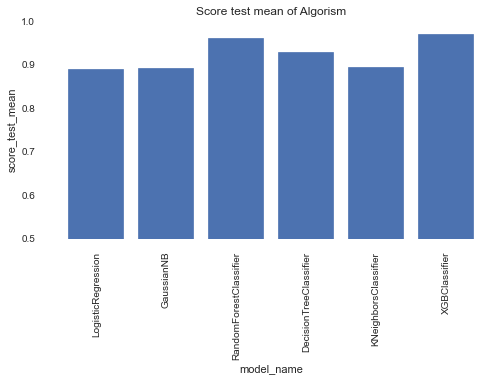

In [85]:
plt.figure(figsize=(8, 4))
plt.bar(cv_df['model_name'], cv_df['score_test_mean'])
plt.ylim(0.5, 1)
plt.xlabel('model_name')
plt.ylabel('score_test_mean')
plt.xticks(rotation='vertical')
plt.title('Score test mean of Algorism')
plt.show()

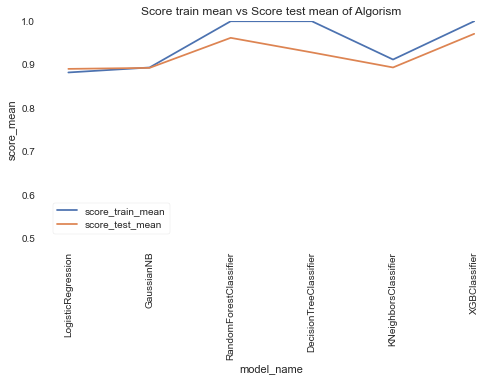

In [86]:
plt.figure(figsize=(8,4))
plt.plot(cv_df['score_train_mean'], label = 'score_train_mean')
plt.plot(cv_df['score_test_mean'], label = 'score_test_mean')
plt.ylim(0.5,1)
plt.xlabel('model_name')
plt.ylabel('score_mean')
plt.xticks(ticks=range(0, len(cv_df)), labels=cv_df['model_name'],rotation='vertical')
plt.title('Score train mean vs Score test mean of Algorism')
plt.legend()

In [87]:
from sklearn.preprocessing import RobustScaler

In [88]:
scaler = RobustScaler()

In [89]:
X_scale = scaler.fit_transform(X)
X_scale = pd.DataFrame(X_scale, columns=X.columns)
X_scale

,Customer_Age,Income_Category,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M
0,-0.090909,0.5,0.5,-1.0,1.0,0.956476,-0.350175,2.627193,-1.065558,-0.694444,3.911017,-0.239583,1.0
1,0.272727,-0.5,1.0,-1.0,0.0,0.435477,-0.289123,3.530702,-1.008702,-0.944444,12.762712,-0.147917,0.0
2,0.454545,1.0,0.0,-1.0,-2.0,-0.132863,-0.895439,8.149123,-0.778186,-1.305556,6.911017,-0.366667,1.0
3,-0.545455,-0.5,-0.5,2.0,-1.0,-0.145198,0.870877,2.934211,-1.055115,-1.305556,6.911017,1.216667,0.0
4,-0.545455,0.5,0.5,-1.0,-2.0,0.019618,-0.895439,6.311404,-1.192419,-1.083333,7.618644,-0.366667,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.363636,0.0,-0.5,0.0,1.0,-0.064141,0.403509,-0.144737,4.477664,1.388889,0.656780,0.595833,1.0
10123,-0.454545,0.0,0.0,0.0,1.0,-0.031953,0.638596,0.298246,1.881648,0.055556,-0.080508,0.697917,1.0
10124,-0.181818,-0.5,0.5,1.0,2.0,0.101028,-0.895439,0.364035,2.472249,-0.194444,0.491525,-0.366667,0.0
10125,-1.454545,0.0,0.0,1.0,1.0,0.085991,-0.895439,-0.881579,1.738929,-0.138889,0.084746,-0.366667,1.0


In [90]:
# Logistic, Naive bayes, SVM, RandomForesrClassifier, DecisionTreeClassifier
models = [
    LogisticRegression(max_iter=200),
    GaussianNB(),
    RandomForestClassifier(n_estimators=200),
    DecisionTreeClassifier(),
    KNeighborsClassifier(n_neighbors=6),
    XGBClassifier(random_state = 42)
]
CV = 10
entries = []
i = 0

for model in models:
    scores_train = []
    scores_test = []
    times = []
    abs_scores = []
    for j in range(CV):
        X_train, X_test, y_train, y_test = train_test_split(X_scale,y,
                                                           test_size=0.3)
        t1 = datetime.datetime.now()
        model_name = model.__class__.__name__
        model.fit(X_train, y_train)
        t2 = datetime.datetime.now()
        d = round((t2 - t1).microseconds/1000,1) # => miliseconds
        score_train = model.score(X_train, y_train)
        score_test = model.score(X_test, y_test)
        abs_score = abs(score_train - score_test)
        
        scores_train.append(score_train)
        scores_test.append(score_test)
        abs_scores.append(abs_score)
        times.append(d)
        
    print(model.__class__.__name__, scores_test)
    entries.append([model_name, np.array(score_train).mean(),
                   np.array(score_test).mean(), np.array(abs_scores).mean(),
                   np.array(times).mean()])
    # i += 1
cv_df_scale = pd.DataFrame(entries,
                    columns=['model_name', 'score_train_mean',
                            'score_test_mean', 'abs_score_mean', 'time_mean'])

LogisticRegression [0.9072063178677197, 0.9002961500493584, 0.9062191510365252, 0.9019414281013491, 0.9124712076340902, 0.9045738729845344, 0.9035867061533399, 0.9042448173741362, 0.8947022046725897, 0.9016123724909509]
GaussianNB [0.8897663705166173, 0.8825271470878578, 0.8910825929582099, 0.8726554787759131, 0.8848305363606449, 0.8841724251398486, 0.8798947022046726, 0.8831852583086541, 0.8877920368542284, 0.8894373149062191]
RandomForestClassifier [0.9641329384666009, 0.9644619940769991, 0.9638038828562027, 0.9647910496873972, 0.9647910496873972, 0.9601842711418229, 0.9601842711418229, 0.9644619940769991, 0.9687397170121751, 0.9634748272458046]
DecisionTreeClassifier [0.9358341559723593, 0.9453767686739059, 0.9355051003619612, 0.9381375452451465, 0.9381375452451465, 0.9404409345179335, 0.9410990457387298, 0.9401118789075353, 0.9364922671931556, 0.9358341559723593]
KNeighborsClassifier [0.9144455412964791, 0.9167489305692662, 0.920368542283646, 0.9174070417900625, 0.9154327081276735,

In [91]:
cv_df_scale

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.903358,0.901612,0.004968,13.41
1,GaussianNB,0.886569,0.889437,0.005011,1.99
2,RandomForestClassifier,1.000000,0.963475,0.036097,268.54
3,DecisionTreeClassifier,1.000000,0.935834,0.061303,31.67
4,KNeighborsClassifier,0.933832,0.921356,0.016843,17.42
5,XGBClassifier,1.000000,0.975321,0.029418,335.19


In [92]:
cv_df

,model_name,score_train_mean,score_test_mean,abs_score_mean,time_mean
0,LogisticRegression,0.882195,0.890424,0.004645,59.89
1,GaussianNB,0.893623,0.892728,0.006117,2.00
2,RandomForestClassifier,1.000000,0.961830,0.037479,265.15
3,DecisionTreeClassifier,1.000000,0.928266,0.063343,32.13
4,KNeighborsClassifier,0.911964,0.893715,0.026768,16.03
5,XGBClassifier,1.000000,0.971043,0.031918,326.12


- XGBoost, Randomforest and DecisionTree have the highest accuracy.
- GaussianNB is the fastest algorism

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                   test_size=0.3,
                                                   random_state=42)

In [94]:
X_train_scale, X_test_scale, y_train, y_test = train_test_split(X_scale,y,
                                                   test_size=0.3,
                                                   random_state=42)

In [95]:
from imblearn.over_sampling import SMOTE

In [96]:
sm = SMOTE(random_state=42)

In [149]:
X_train_resample, y_train_resample = sm.fit_resample(X_train_scale, y_train)

### Gaussian Naive Bayes

In [111]:
g_nb = GaussianNB()
raw_nb = g_nb.fit(X_train, y_train)

In [112]:
y_pred_nb = raw_nb.predict(X_test)

In [113]:
from sklearn.metrics import classification_report

In [114]:
print(classification_report(y_test, y_pred_nb))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93      2543
           1       0.66      0.58      0.62       496

    accuracy                           0.88      3039
   macro avg       0.79      0.76      0.77      3039
weighted avg       0.88      0.88      0.88      3039



In [115]:
# predict probability
y_pred_proba = raw_nb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

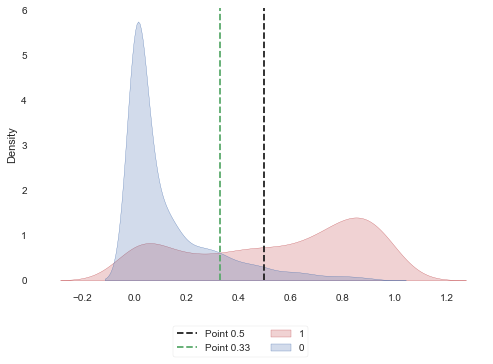

In [123]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.33, ls = '--', color = 'g', label = 'Point 0.33')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [124]:
y_pred_now = pos_proba > 0.33
y_pred_now

array([False, False, False, ..., False, False, False])

In [125]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.94      0.87      0.90      2543
           1       0.52      0.71      0.60       496

    accuracy                           0.84      3039
   macro avg       0.73      0.79      0.75      3039
weighted avg       0.87      0.84      0.85      3039



In [126]:
re_nb = g_nb.fit(X_train_resample, y_train_resample)

In [127]:
y_pred_nb_re = re_nb.predict(X_test)

In [128]:
print(classification_report(y_test, y_pred_nb_re))

              precision    recall  f1-score   support

           0       0.95      0.79      0.86      2543
           1       0.42      0.77      0.54       496

    accuracy                           0.79      3039
   macro avg       0.68      0.78      0.70      3039
weighted avg       0.86      0.79      0.81      3039



In [129]:
# predict probability
y_pred_proba = re_nb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

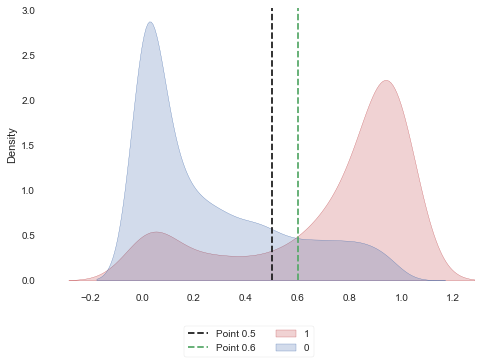

In [130]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.6, ls = '--', color = 'g', label = 'Point 0.6')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

### Logistic Regression

In [131]:
lg = LogisticRegression(max_iter=200)

In [132]:
raw_lg = lg.fit(X_train, y_train)

In [133]:
y_pred_lg = raw_lg.predict(X_test)

In [134]:
print(classification_report(y_test, y_pred_lg))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2543
           1       0.73      0.42      0.53       496

    accuracy                           0.88      3039
   macro avg       0.81      0.69      0.73      3039
weighted avg       0.87      0.88      0.87      3039



In [135]:
# predict probability
y_pred_proba = raw_lg.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

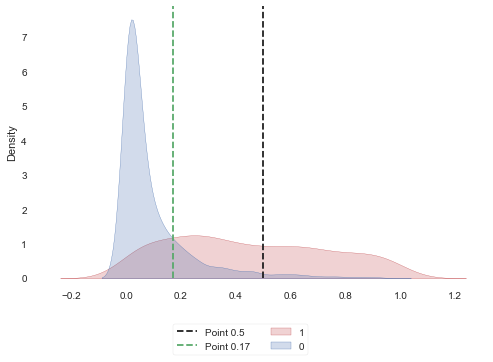

In [138]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.17, ls = '--', color = 'g', label = 'Point 0.17')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [139]:
y_pred_now = pos_proba > 0.17
y_pred_now

array([False, False, False, ..., False,  True,  True])

In [140]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.95      0.83      0.89      2543
           1       0.48      0.80      0.60       496

    accuracy                           0.82      3039
   macro avg       0.72      0.81      0.74      3039
weighted avg       0.88      0.82      0.84      3039



In [141]:
scale_lg = lg.fit(X_train_scale, y_train)

In [142]:
print(classification_report(y_test, scale_lg.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2543
           1       0.77      0.53      0.63       496

    accuracy                           0.90      3039
   macro avg       0.84      0.75      0.78      3039
weighted avg       0.89      0.90      0.89      3039



In [143]:
# predict probability
y_pred_proba = scale_lg.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

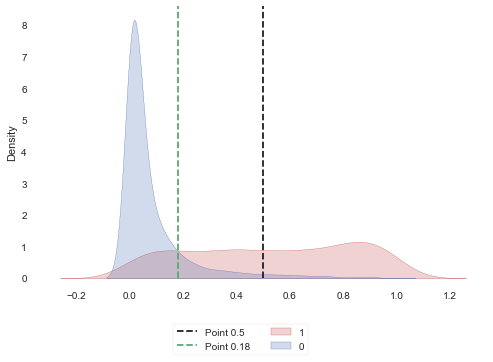

In [145]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.18, ls = '--', color = 'g', label = 'Point 0.18')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [150]:
re_lg = lg.fit(X_train_resample, y_train_resample)

In [151]:
print(classification_report(y_test, scale_lg.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.96      0.86      0.91      2543
           1       0.53      0.84      0.65       496

    accuracy                           0.85      3039
   macro avg       0.75      0.85      0.78      3039
weighted avg       0.89      0.85      0.87      3039



In [152]:
# predict probability
y_pred_proba = re_lg.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

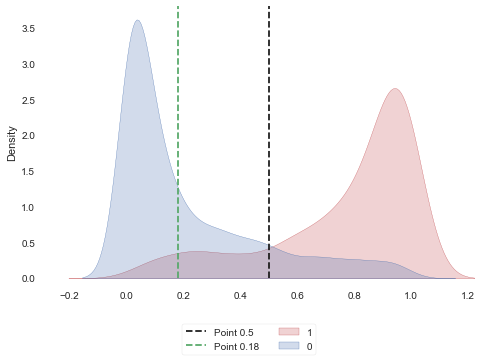

In [153]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.18, ls = '--', color = 'g', label = 'Point 0.18')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

### RandomForest

In [154]:
rd = RandomForestClassifier(n_estimators=200)

In [155]:
raw_rd = rd.fit(X_train, y_train)

In [156]:
print(classification_report(y_test, raw_rd.predict(X_test)))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2543
           1       0.93      0.84      0.88       496

    accuracy                           0.96      3039
   macro avg       0.95      0.91      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [157]:
# predict probability
y_pred_proba = raw_rd.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

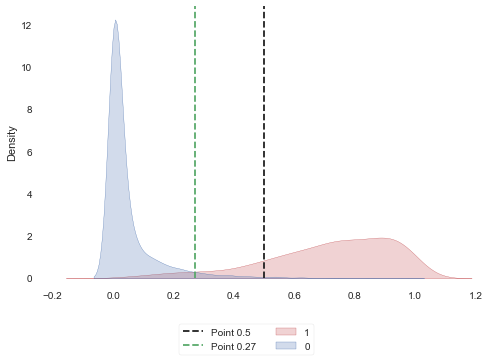

In [160]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.27, ls = '--', color = 'g', label = 'Point 0.27')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [161]:
y_pred_now = pos_proba > 0.27
y_pred_now

array([False, False, False, ..., False, False, False])

In [162]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      2543
           1       0.80      0.95      0.87       496

    accuracy                           0.95      3039
   macro avg       0.90      0.95      0.92      3039
weighted avg       0.96      0.95      0.96      3039



In [163]:
re_rd = rd.fit(X_train_resample, y_train_resample)

In [164]:
print(classification_report(y_test, re_rd.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2543
           1       0.87      0.88      0.88       496

    accuracy                           0.96      3039
   macro avg       0.93      0.93      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [166]:
# predict probability
y_pred_proba = re_rd.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

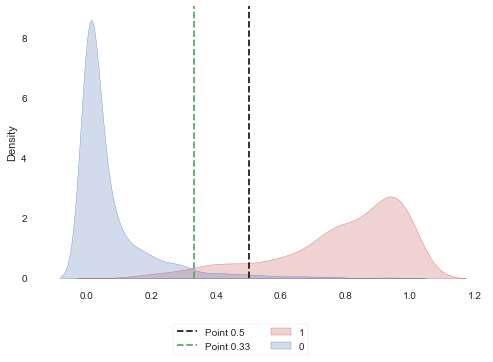

In [169]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.33, ls = '--', color = 'g', label = 'Point 0.33')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [170]:
y_pred_now = pos_proba > 0.33
y_pred_now

array([False, False, False, ..., False, False, False])

In [171]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      2543
           1       0.79      0.96      0.87       496

    accuracy                           0.95      3039
   macro avg       0.89      0.96      0.92      3039
weighted avg       0.96      0.95      0.95      3039



### XGBoostClassifier

In [172]:
xgb = XGBClassifier(random_state=42)

In [173]:
raw_xgb = xgb.fit(X_train, y_train)

[11:25:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [174]:
print(classification_report(y_test, raw_xgb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2543
           1       0.89      0.88      0.89       496

    accuracy                           0.96      3039
   macro avg       0.93      0.93      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [175]:
# predict probability
y_pred_proba = raw_xgb.predict_proba(X_test)
# take the churn probability
pos_proba = y_pred_proba[:,1]

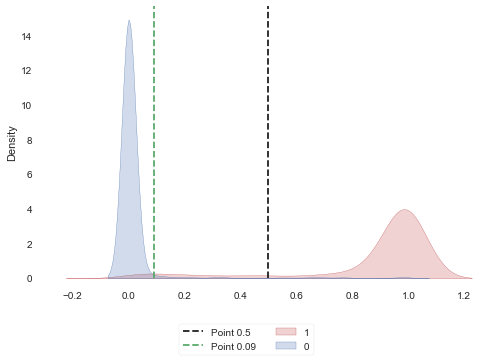

In [178]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.09, ls = '--', color = 'g', label = 'Point 0.09')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [179]:
y_pred_now = pos_proba > 0.09
y_pred_now

array([False, False, False, ..., False, False, False])

In [180]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2543
           1       0.81      0.96      0.88       496

    accuracy                           0.96      3039
   macro avg       0.90      0.96      0.93      3039
weighted avg       0.96      0.96      0.96      3039



In [181]:
re_xgb = xgb.fit(X_train_resample, y_train_resample)

[11:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [182]:
print(classification_report(y_test, re_xgb.predict(X_test_scale)))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2543
           1       0.89      0.92      0.90       496

    accuracy                           0.97      3039
   macro avg       0.94      0.95      0.94      3039
weighted avg       0.97      0.97      0.97      3039



In [183]:
# predict probability
y_pred_proba =re_xgb.predict_proba(X_test_scale)
# take the churn probability
pos_proba = y_pred_proba[:,1]

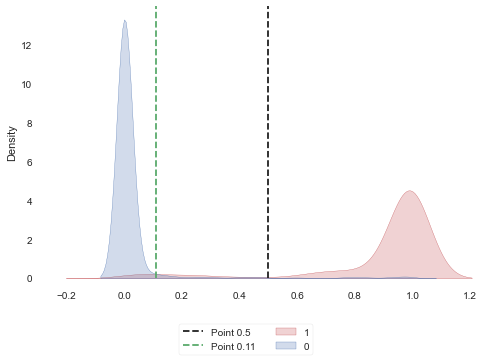

In [185]:
# Visualization of churn proba to choose the threshold

plt.figure(figsize=(8,5))
sns.kdeplot(pos_proba[y_test == 1], label = 1, color = 'r',
           shade=True)
sns.kdeplot(pos_proba[y_test == 0], label = 0, color = 'b',
           shade=True)
plt.axvline(x=0.5, ls = '--', color = 'k', label = 'Point 0.5')
plt.axvline(x=0.11, ls = '--', color = 'g', label = 'Point 0.11')

plt.legend(bbox_to_anchor=(0.3, -0.3, 0.3, 0.2), ncol =2, loc='lower center')

In [186]:
y_pred_now = pos_proba > 0.11
y_pred_now

array([False, False, False, ..., False, False, False])

In [187]:
print(classification_report(y_test, y_pred_now))

              precision    recall  f1-score   support

           0       0.99      0.95      0.97      2543
           1       0.78      0.96      0.87       496

    accuracy                           0.95      3039
   macro avg       0.89      0.96      0.92      3039
weighted avg       0.96      0.95      0.95      3039

